In [1]:
# imports

from __future__ import division
%config Completer.use_jedi = False
import os
print(os.getcwd())

import numpy as np
import torchaudio
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

import torch
print(torch.__version__)

LOCATA=False
TEST=False

/homes/iws/anranw/notebook


/homes/iws/anranw/.local/lib/python3.6/site-packages/torchaudio/backend/utils.py:54: UserWarning: "sox" backend is being deprecated. The default backend will be changed to "sox_io" backend in 0.8.0 and "sox" backend will be removed in 0.9.0. Please migrate to "sox_io" backend. Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
  '"sox" backend is being deprecated. '


1.7.1+cu101


In [2]:
%%html
<style type='text/css'>
.CodeMirror{
font-family: Consolas;
</style>

In [3]:
# path constants
vctk_path='../remote'
locata_path='../remote'
cache_path='../cache'
fs=48000
V=343

In [4]:
import locata
from locata import LocataDataset
if LOCATA:
    locata=LocataDataset('../remote/eval/', 'benchmark2', 48000, dev=True)

In [5]:
vctk=torchaudio.datasets.VCTK('../remote/')

In [6]:
print(len(vctk))
print(vctk[0][0].numpy()[0])
#print(len(locata))
#print(locata[0][1])

44070
[0.00485229 0.0067749  0.0062561  ... 0.00817871 0.00805664 0.00878906]


In [38]:
# gpu check
import torch.cuda as cutorch
for i in range(cutorch.device_count()):
     print(cutorch.get_device_properties(i))


import subprocess
result = subprocess.check_output(['nvidia-smi'], encoding='utf-8')
print(result)

_CudaDeviceProperties(name='GeForce GTX 1060 6GB', major=6, minor=1, total_memory=6077MB, multi_processor_count=10)
Fri Mar 12 18:35:34 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.56       Driver Version: 418.56       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 106...  Off  | 00000000:03:00.0 Off |                  N/A |
|  6%   51C    P8     8W / 120W |   1259MiB /  6077MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+---------------------------------------------------

In [8]:
# vctk audio check
import IPython.display as ipd
print(vctk[0])
ipd.Audio(vctk[0][0].numpy()[0], rate=fs)

(tensor([[0.0049, 0.0068, 0.0063,  ..., 0.0082, 0.0081, 0.0088]]), 48000, 'Please call Stella.\n', 'p225', '001')


In [9]:
# vctk adapter
class VCTKAudio:
    def __init__(self, vctk, numpy=True):
        self.vctk=vctk
        self.numpy=numpy
        
    def __getitem__(self, idx):
        return self.vctk[idx][0][0].numpy() if self.numpy else self.vctk[idx][0][0]
    
    def __len__(self):
        return len(self.vctk)

In [10]:
# locata audio test
if LOCATA:
    ipd.Audio(locata[0][0][:,0], rate=fs)

In [11]:
# MS dataset
import librosa
class MS_SNSD:
    def __init__(self, path, shuffle=True):
        noisy_wav_dir_path = [path+'/noise_test', path+'/noise_train']
        self.noisy_files = []
        for noisy_wav_dir in noisy_wav_dir_path:
            for file in os.listdir(noisy_wav_dir):
                if file.endswith('.wav'):
                    self.noisy_files.append(os.path.join(noisy_wav_dir, file))
        if shuffle:
            np.random.shuffle(self.noisy_files)
    def __len__(self):
        return len(self.noisy_files)
    def __read_audio(self,file):
        noise_audio, _ = librosa.load(file, sr=fs, mono=True)
        return noise_audio
    def __getitem__(self, idx):
        return self.__read_audio(self.noisy_files[idx])
    def get_batch(self, idx1, idx2):
        mic_sig_batch = []
        for idx in range(idx1, idx2):
            mic_sig_batch.append(self.__read_audio(self.noisy_files[idx]))
            
        return np.stack(mic_sig_batch)

In [12]:
ms_snsd=MS_SNSD('../remote/MS-SNSD')
print(ms_snsd[0])
ipd.Audio(ms_snsd[0], rate=fs)

[-0.00010072 -0.00031748 -0.00073243 ... -0.00039786 -0.00026602
 -0.00010614]


In [13]:
# acoustic property
N_MIC=6
R_MIC=0.06

max_rt60=0.3
max_room_dim=[10,10,4]
min_room_dim=[4,4,2]
min_dist=0.8 # dist between mic and person
min_gap=1.2 # gap between mic and walls

import pyroomacoustics as pra


def generate_mic_array(mic_radius: float, n_mics: int, pos):
    """
    Generate a list of Microphone objects
    Radius = 50th percentile of men Bitragion breadth
    (https://en.wikipedia.org/wiki/Human_head)
    """
    R = pra.circular_2D_array(center=[pos[0], pos[1]], M=n_mics, phi0=0, radius=mic_radius)
    R=np.concatenate((R, np.ones((1, n_mics))*pos[2]), axis=0)
    return R

# global mic array:
R_global=generate_mic_array(R_MIC, N_MIC, (0,0,0))

In [14]:
# simulate the room

def get_dist(p1, p2):
    return np.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

def get_angle(px, py):
    return np.arctan2(py, px)

def random2D(range_x, range_y, except_x, except_y, except_r, retry=100):
    if retry==0: return None
    if except_r<except_x<range_x-except_r and except_r<except_y<range_y-except_r:
        loc=(np.random.uniform(0, range_x), np.random.uniform(0, range_y))
        if get_dist(loc, (except_x, except_y))<except_r:
            return random2D(range_x, range_y, except_x, except_y, except_r, retry-1)
        else:
            return loc
    else:
        return None
        
def simulateRoom(N_source, min_room_dim, max_room_dim, min_gap, min_dist, min_angle_diff=0, retry=15):
    if retry==0: return None
    # return simulated room
    room_dim=[np.random.uniform(low, high) for low, high in zip(min_room_dim, max_room_dim)]
    R_loc=[np.random.uniform(min_gap, x-min_gap) for x in room_dim]
    source_locations=[random2D(room_dim[0], room_dim[1], R_loc[0], R_loc[1], min_dist) for i in range(N_source)]
    if None in source_locations: return None
    
    angles=[get_angle(p[0]-R_loc[0], p[1]-R_loc[1]) for p in source_locations]
    if N_source>1:
        min_angle_diff*=np.pi/180
        angles_sorted=np.sort(angles)
        if np.min(angles_sorted[1:]-angles_sorted[:-1])<min_angle_diff or angles_sorted[0]-angles_sorted[-1]+2*np.pi<min_angle_diff:
            return simulateRoom(N_source, min_room_dim, max_room_dim, min_gap, min_dist, min_angle_diff, retry-1)
    
    source_locations=[(x,y,R_loc[2]) for x,y in source_locations]
    
    return (room_dim, R_loc, source_locations, angles)

# Define materials
wall_materials = [
    'hard_surface',
    'brickwork',
    'rough_concrete',
    'unpainted_concrete',
    'rough_lime_wash',
    'smooth_brickwork_flush_pointing',
    'smooth_brickwork_10mm_pointing',
    'brick_wall_rough',
    'ceramic_tiles',
    'limestone_wall',
    'reverb_chamber'
]
floor_materials = [
    'linoleum_on_concrete',
    'carpet_cotton',
    'carpet_tufted_9.5mm',
    'carpet_thin',
    'carpet_6mm_closed_cell_foam',
    'carpet_6mm_open_cell_foam',
    'carpet_tufted_9m',
    'felt_5mm',
    'carpet_soft_10mm',
    'carpet_hairy',
]

def simulateSound(room_dim, R_loc, source_locations, source_audios, rt60, materials=None, max_order=None):
    # source_audios: array of numpy array
    # L: max of all audios. Zero padding at the end
    # return (all_channel_data (C, L), groundtruth_with_reverb (N, C, L), groundtruth_data (N, C, L), angles (N)
    
    if materials is not None:
        (ceiling, east, west, north, south, floor)=materials
        room = pra.ShoeBox(
            room_dim,
            fs=fs,
            materials=pra.make_materials(
                ceiling=ceiling,
                floor=floor,
                east=east,
                west=west,
                north=north,
                south=south,
            ), max_order=max_order
        )
    else:
        try:
            e_absorption, max_order_rt60 = pra.inverse_sabine(rt60, room_dim)    
        except ValueError:
            e_absorption, max_order_rt60 = pra.inverse_sabine(1, room_dim)
        room=pra.ShoeBox(room_dim, fs=fs, materials=pra.Material(e_absorption), max_order=max_order_rt60)
        #room=pra.ShoeBox(room_dim, fs=fs, materials=pra.Material(e_absorption), max_order=0)
    
    R=generate_mic_array(R_MIC, N_MIC, R_loc)
    room.add_microphone_array(pra.MicrophoneArray(R, room.fs))
    
    length=max([len(source_audios[i]) for i in range(len(source_audios))])
    for i in range(len(source_audios)):
        source_audios[i]=np.pad(source_audios[i], (0, length-len(source_audios[i])), 'constant')
        
    
    for i in range(len(source_locations)):
        room.add_source(source_locations[i], signal=source_audios[i], delay=0)
    
    room.image_source_model()
    premix_w_reverb=room.simulate(return_premix=True)
    mixed=room.mic_array.signals
    
    # groundtruth
    room_gt=pra.ShoeBox(room_dim, fs=fs, materials=pra.Material(1.0), max_order=0)
    #R_gt=generate_mic_array(R_MIC, N_MIC, R_loc)
    R_gt=R[:, 0].reshape((3,1)) #generate_mic_array(0,1,R_loc)
    room_gt.add_microphone_array(pra.MicrophoneArray(R_gt, room.fs))
    
    for i in range(len(source_locations)):
        room_gt.add_source(source_locations[i], signal=source_audios[i], delay=0)
    room_gt.compute_rir()
    
    room_gt.image_source_model()
    premix=room_gt.simulate(return_premix=True)
    
    return (mixed, premix_w_reverb, premix)

def simulateBackground(background_audio):
    # diffused noise. simulate in a large room
    bg_radius = np.random.uniform(low=10.0, high=20.0)
    bg_theta = np.random.uniform(low=0, high=2 * np.pi)
    H=10
    bg_loc = [bg_radius * np.cos(bg_theta), bg_radius * np.sin(bg_theta), H]

    # Bg should be further away to be diffuse
    left_wall = np.random.uniform(low=-40, high=-20)
    right_wall = np.random.uniform(low=20, high=40)
    top_wall = np.random.uniform(low=20, high=40)
    bottom_wall = np.random.uniform(low=-40, high=-20)
    height = np.random.uniform(low=20, high=40)
    corners = np.array([[left_wall, bottom_wall], [left_wall, top_wall],
                    [   right_wall, top_wall], [right_wall, bottom_wall]]).T
    absorption = np.random.uniform(low=0.5, high=0.99)
    room = pra.Room.from_corners(corners,
                                 fs=fs,
                                 max_order=10,
                                 materials=pra.Material(absorption))
    room.extrude(height)
    mic_array = generate_mic_array(R_MIC, N_MIC, (0,0,H))
    room.add_microphone_array(pra.MicrophoneArray(mic_array, fs))
    room.add_source(bg_loc, signal=background_audio)

    room.image_source_model()
    room.simulate()
    return room.mic_array.signals


In [15]:
# test room simulation
if TEST:
    room_dim, R_loc, source_loc, angles=simulateRoom(3, (3,3,3), (10, 10,10), 1, 1, 10)
    fig=plt.figure()
    ax=fig.add_subplot(111, projection='3d')
    ax.scatter(room_dim[0], room_dim[1], room_dim[2], marker='o')
    ax.scatter(R_loc[0], R_loc[1], R_loc[2], marker='*')
    for x in source_loc:
        ax.scatter(x[0], x[1], x[2], marker='.')
    plt.show()
    print(room_dim, R_loc, source_loc, angles)

    mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, [np.random.randn(10000) for i in range(len(source_loc))], 0.3)

    print(mixed.shape, premix.shape, premix_w_reverb.shape)

    ceiling, east, west, north, south = tuple(np.random.choice(wall_materials, 5))  # sample material
    floor = np.random.choice(floor_materials)  # sample material
    mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, [np.random.randn(10000) for i in range(len(source_loc))], 0, (ceiling, east, west, north, south, floor), 5)

    print(mixed.shape, premix.shape, premix_w_reverb.shape)

In [16]:
# Audio simulation

from util import power, mix
from torch.utils.data import Dataset
import numpy as np
import pyroomacoustics as pra
import os

class OnlineSimulationDataset(Dataset):
    def __init__(self, voice_collection, noise_collection, length, simulation_config, truncator, cache_folder, cache_max=None):
        self.voices=voice_collection
        self.noises=noise_collection
        self.length=length
        self.seed=simulation_config['seed']
        self.additive_noise_min_snr=simulation_config['min_snr']
        self.additive_noise_max_snr=simulation_config['max_snr']
        self.special_noise_ratio=simulation_config['special_noise_ratio']
        self.max_source=simulation_config['max_source']
        self.min_angle_diff=simulation_config['min_angle_diff']
        self.max_rt60=simulation_config['max_rt60'] # 0.3s
        self.min_rt60=0.15 # minimum to satisfy room odometry
        self.max_room_dim=simulation_config['max_room_dim'] # [10,10,4]
        self.min_room_dim=simulation_config['min_room_dim'] #[4,4,2]
        self.min_dist=simulation_config['min_dist'] # 0.8, dist between mic and person
        self.min_gap=simulation_config['min_gap'] # 1.2, gap between mic and walls
        self.max_order=simulation_config['max_order']
        self.randomize_material_ratio=simulation_config['randomize_material_ratio']
        self.max_latency=simulation_config['max_latency']
        self.random_volume_range=simulation_config['random_volume_range'] # max and min volume ratio for sources
        
        self.truncator=truncator
        self.cache_folder=cache_folder
        self.cache_history=[]
        self.cache_max=cache_max
        
    def __seed_for_idx(self,idx):
        return self.seed+idx
    
    def __len__(self):
        return self.length
    def __getitem__(self, idx):
        # return format: 
        # (
        # mixed multichannel audio, (C,L)
        # array of groundtruth with reverb for each target, (N, C, L)
        # array of direction of targets, (N,)
        # array of multichannel ideal groundtruths for each target, (N, C, L)
        # noise (C, L)
        # )
        # check cache first
        
        if idx>=self.length:
            return None
        
        if self.cache_folder is not None:
            cache_path=self.cache_folder+'/'+str(idx)+'-'+str(self.seed)+'.npz'
            
            if cache_path not in self.cache_history:
                self.cache_history.append(cache_path)
            
                if self.cache_max is not None and self.cache_max==len(self.cache_history):
                    # delete first one
                    first=self.cache_history[0]
                    os.remove(first)
                    self.cache_history=self.cache_history[1:]
                
            if os.path.exists(cache_path):
                cache_result=np.load(cache_path, allow_pickle=True)['data']
                return cache_result[0], cache_result[1], cache_result[2], cache_result[3], cache_result[4]
        else:
            cache_path=None
        
        
        np.random.seed(self.__seed_for_idx(idx))
        n_source=np.random.randint(self.max_source)+1
        
        room_result=simulateRoom(n_source, self.min_room_dim, self.max_room_dim, self.min_gap, self.min_dist, self.min_angle_diff)
        if room_result is None:
            return self.__getitem__(idx+1) # backoff
            
        room_dim, R_loc, source_loc, source_angles=room_result
        
        voices=[self.truncator.process(self.voices[vi]) for vi in np.random.choice(len(self.voices), n_source)]
        voices=[v*np.random.uniform(self.random_volume_range[0], self.random_volume_range[1]) for v in voices]
        
        
        if self.special_noise_ratio>np.random.rand():
            noise=self.truncator.process(self.noises[np.random.choice(len(self.noises))])
        else:
            noise=np.random.randn(self.truncator.get_length())

        if self.randomize_material_ratio>np.random.rand():
            ceiling, east, west, north, south = tuple(np.random.choice(wall_materials, 5))  # sample material
            floor = np.random.choice(floor_materials)  # sample material
            mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, voices, 0, (ceiling, east, west, north, south, floor), self.max_order)
        else:
            rt60=np.random.uniform(self.min_rt60, self.max_rt60)
            mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, voices, rt60)
        
        
        background=simulateBackground(noise)
        snr=np.random.uniform(self.additive_noise_min_snr, self.additive_noise_max_snr)
        
        # trucate to the same length
        mixed=mixed[:, :truncator.get_length()]
        background=background[:, :truncator.get_length()]
        
        total, background=mix(mixed, background, snr)
        
        # save cache
        if cache_path is not None:
            np.savez_compressed(cache_path, data=[total, premix_w_reverb, source_angles, premix, background])
        
        return total, premix_w_reverb, source_angles, premix, background
        #return mixed, premix_w_reverb, source_angles, premix, background

In [17]:
# randomly truncate audio to fixed length

class RandomTruncate:
    def __init__(self, target_length, seed, power_threshold=None):
        self.length=target_length
        self.seed=seed
        self.power_threshold=power_threshold
        np.random.seed(seed)
    
    def process(self, audio):
        # if there is a threshold
        if self.power_threshold is not None:
            # smooth
            power=np.convolve(audio**2, np.ones((32,)), 'same')
            avgpower=np.mean(power)
            for i in range(len(power)):
                # threshold*mean_power
                if power[i]>avgpower*self.power_threshold:
                    #print(i, power[i], avgpower)
                    # leave ~=0.3s of start
                    fs=48000
                    audio=audio[max(0, i-int(0.3*fs)):]
                    break
            
        if len(audio)<self.length:
            nfront=np.random.randint(self.length-len(audio))
            return np.pad(audio, (nfront, self.length-len(audio)-nfront), 'constant')
        elif len(audio)==self.length:
            return audio
        else:
            start=np.random.randint(len(audio)-self.length)
            return audio[start:start+self.length]
        
    def get_length(self):
        return self.length
        

In [18]:
# test simulation dataset and truncate
simulation_config={
    'seed':3,
    'min_snr':5,
    'max_snr':20,
    'special_noise_ratio':0.8,
    'max_source':3,
    'min_angle_diff':15,
    'max_rt60': 0.3,
    'max_room_dim':[10,10,4],
    'min_room_dim':[4,4,2],
    'min_dist': 0.8,
    'min_gap': 1.2,
    'max_order':5,
    'randomize_material_ratio':0.5,
    'max_latency':0.5,
    'random_volume_range': [0.7, 1]
}
vctk_audio=VCTKAudio(vctk)
truncator=RandomTruncate(3*fs, 5, 0.4)

# no cache for the original dataset
dataset=OnlineSimulationDataset(vctk_audio, ms_snsd, 300, simulation_config, truncator, None)

In [19]:
# test one of them

total, premix_w_reverb, angles, premix, background=dataset[4]
print(total.shape, premix_w_reverb.shape, premix.shape)
print(angles)
ipd.display(ipd.Audio(total, rate=48000))
ipd.display(ipd.Audio(premix_w_reverb[0], rate=48000))
ipd.display(ipd.Audio(premix[0], rate=48000))
ipd.display(ipd.Audio(background, rate=48000))

(6, 144000) (1, 6, 179040) (1, 1, 145058)
[-2.8939212017777933]


[[ 6.00000000e-02  3.00000000e-02 -3.00000000e-02 -6.00000000e-02
  -3.00000000e-02  3.00000000e-02]
 [ 0.00000000e+00  5.19615242e-02  5.19615242e-02  7.34788079e-18
  -5.19615242e-02 -5.19615242e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]]


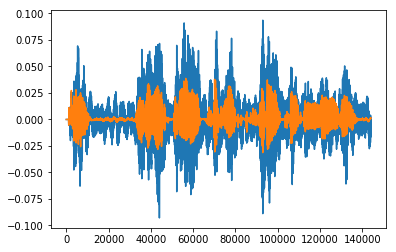

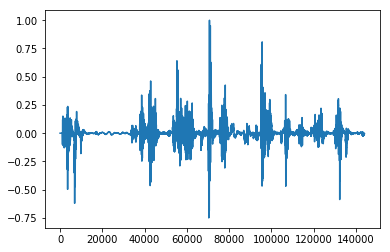

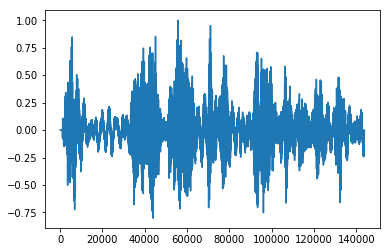

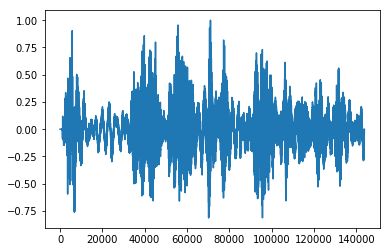

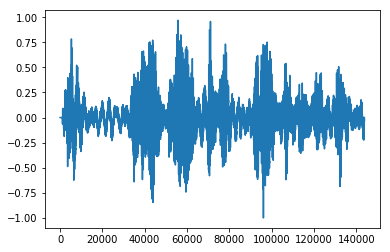

In [20]:
# beamformer test
import beamformer
import importlib
importlib.reload(beamformer)
from beamformer import WebrtcBeamformer, OnlineMVDRBeamformer
buffer_size_webrtc=256 # approx. 5ms
buffer_size_mvdr=256
webrtc_path='../projects/webrtc_beamformer/deepbeam/beamform_mic_array'

beamformers=[WebrtcBeamformer(buffer_size_webrtc, R_global, fs, webrtc_path, cache_path), 
             OnlineMVDRBeamformer(buffer_size_mvdr, R_global, fs, V, False), # superdirective
             OnlineMVDRBeamformer(buffer_size_mvdr, R_global, fs, V, True, False), # mvdr
             OnlineMVDRBeamformer(buffer_size_mvdr, R_global, fs, V, False, False, True) # delay-and-sum
            ]

ipd.display(ipd.Audio(total, rate=48000))
plt.figure()
plt.plot(total[0])
plt.plot(premix[0,0][:144000])
plt.show()
ipd.display(ipd.Audio(total[0]-premix[0,0][:144000], rate=48000))

for bf in beamformers:
    newaudio=bf.process(total.T, angles[0])
    ipd.display(ipd.Audio(newaudio, rate=48000))
    plt.figure()
    plt.plot(newaudio)
    plt.show()

In [21]:
if TEST:
    ang=1.28
    signal=beamformers[1].process(total.T, ang)
    plt.figure()
    plt.plot(premix[0].reshape((-1,))[:140000])
    plt.plot(signal[:140000])


In [22]:
# test webrtc beamformer

if TEST:

    from util import si_sdr
    xs=[]
    ys=[]

    def get_power(signal):
        return np.sum(signal**2)/signal.size
    for ang in np.arange(0, 2*np.pi, 0.05):
        if ang%0.5<0.05:
            print(ang)
        signal=beamformers[0].process(total.T, ang)
        xs.append(ang)
        ys.append(si_sdr(signal[:140000], premix[0].reshape((-1,))[:140000]))
        #ys.append(get_power(signal))

    plt.figure()
    plt.plot(xs,ys)
    plt.show()


In [23]:
if TEST:
    for ang in np.arange(-3, -2, 0.1):
        print(ang)
        signal=beamformers[0].process(total.T, ang)
        ipd.display(ipd.Audio(signal, rate=48000))

In [24]:
# test mvdr beamformer
if TEST:
    from util import si_sdr
    xs=[]
    ys=[]

    def get_power(signal):
        return np.sum(signal**2)/signal.size
    for ang in np.arange(0, 2*np.pi, 0.05):
        if ang%0.5<0.05:
            print(ang)
        signal=beamformers[1].process(total.T, ang)
        xs.append(ang)
        #ys.append(get_power(signal))
        ys.append(si_sdr(signal[:140000], premix[0].reshape((-1,))[:140000]))
    plt.figure()
    plt.plot(xs,ys)
    plt.show()


In [25]:
class SimulationBeamformedDataset():
    def __init__(self, simulationDataset, beamformers, cache_folder, cache_max=None):
        self.beamformers=beamformers
        self.dataset=simulationDataset
        
        self.cache_folder=cache_folder
        self.cache_history=[]
        self.cache_max=cache_max
        
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        
        if self.cache_folder is not None:
            cache_path=self.cache_folder+'/sbd-'+str(idx)+'.npz'
            
            if cache_path not in self.cache_history:
                self.cache_history.append(cache_path)
            
                if self.cache_max is not None and self.cache_max==len(self.cache_history):
                    # delete first one
                    first=self.cache_history[0]
                    os.remove(first)
                    self.cache_history=self.cache_history[1:]
                
            if os.path.exists(cache_path):
                cache_result=np.load(cache_path, allow_pickle=True)['data']
                return cache_result[0], cache_result[1], cache_result[2]
        else:
            cache_path=None
        
        total, premix_w_reverb, source_angles, premix, background=self.dataset[idx]
        # choose the first component
        bfdata=np.zeros((len(self.beamformers), total.shape[1]))
        for i in range(len(self.beamformers)):
            res=self.beamformers[i].process(total.T, source_angles[0])[:total.shape[1]]
            if len(res)<total.shape[1]: 
                bfdata[i]=np.pad(res, (0, total.shape[1]-len(res)), 'constant')
            else:
                bfdata[i]=res[:total.shape[1]]
                
                
        # currently only need total, bfdata and premix
        gt=premix[0, :, :total.shape[1]]
        # save cache
        if cache_path is not None:
            np.savez_compressed(cache_path, data=[total, bfdata, gt])
        
        return total, bfdata, gt
    
        #return total, bfdata, premix_w_reverb[0, :, :total.shape[1]], source_angles[0], premix[0, :, :total.shape[1]], background
    

In [26]:
import util
importlib.reload(util)
from util import si_sdr, calculate_gain

train_dataset=SimulationBeamformedDataset(dataset, beamformers, '../bf_cache', 350)

simulation_config_test={
    'seed':5,
    'min_snr':5,
    'max_snr':20,
    'special_noise_ratio':0.8,
    'max_source':3,
    'min_angle_diff':25,
    'max_rt60': 0.3,
    'max_room_dim':[10,10,4],
    'min_room_dim':[4,4,2],
    'min_dist': 0.8,
    'min_gap': 1.2,
    'max_order':5,
    'randomize_material_ratio':0.5,
    'max_latency':0.5,
    'random_volume_range': [0.7, 1]
}
testset=OnlineSimulationDataset(vctk_audio, ms_snsd, 50, simulation_config_test, truncator, '../cache_test', 50)
test_dataset=SimulationBeamformedDataset(testset, beamformers, '../bf_cache_test', 300)

N=5
gains=np.zeros((N, 4))
for i in range(N):
    total, bfdata, premix=train_dataset[i]
    print(total.shape, bfdata.shape, premix.shape)
    for j in range(len(bfdata)):
        bf=bfdata[j]
        gain, _,_=calculate_gain(premix[0], total[0], bf)
        gains[i, j]=gain

(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)


In [27]:
train_dataset[0][0].shape

(6, 144000)

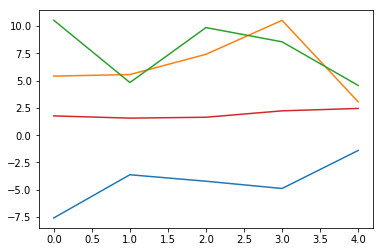

In [28]:
plt.figure()
for i in range(4):
    plt.plot(gains[:,i])
plt.show()

In [37]:
import gc
gc.collect()

33454

In [39]:
# simple model
import gc
import time
import model
importlib.reload(model)
from model import SimpleNetwork

import torch
from torch import optim

BATCH=1

dataloader=torch.utils.data.DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=1)
testloader=torch.utils.data.DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=1)

def train_epoch(model, device, optimizer, dataloader, save_path=None):
    model.train()
    #losses=[]
    tick0=time.time()
    for batch_idx, (total, bfdata, premix) in enumerate(dataloader):
        tick1=time.time()
        data_all=torch.Tensor(np.concatenate([total, bfdata], axis=1))
        data=data_all.to(device)
        premix_gpu=premix.to(device)
        optimizer.zero_grad()
        tick2=time.time()
        
        # print(data.shape)
        output=model(data)
        
        total_gpu=total[:,0,:].to(device)
        loss=model.loss(total_gpu, output, premix_gpu)
        #loss=model.loss(output, premix)
        loss.backward()
        
        #torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()
        tick3=time.time()
        l=loss.item()
        
        data=None
        premix=None
        gc.collect()

        cutorch.empty_cache()        
        tick4=time.time()
        
        print(l, tick1-tick0, tick2-tick1, tick3-tick2, tick4-tick3)
        
        # print()
        tick0=tick4
    if save_path is not None:
        torch.save(model.state_dict(), save_path)
        
def load_path(model, path):
    model.load_state_dict(torch.load(path))
        
device = torch.device('cuda')
network=SimpleNetwork(10, 64, 16, 128, depth=5)
lr=1e-3
decay=0
optimizer = optim.Adam(network.parameters(), lr=lr, weight_decay=decay)

network.to(device)


SimpleNetwork(
  (encoders): ModuleList(
    (0): ModuleDict(
      (conv): CausalComplexConv1d(
        (pad): ConstantPad1d(padding=(14, 0), value=0)
        (l): ComplexConv1d(
          (conv_re): Conv1d(64, 64, kernel_size=(16,), stride=(2,))
          (conv_im): Conv1d(64, 64, kernel_size=(16,), stride=(2,))
        )
      )
      (relu): CSymRelu6()
    )
    (1): ModuleDict(
      (conv): CausalComplexConv1d(
        (pad): ConstantPad1d(padding=(14, 0), value=0)
        (l): ComplexConv1d(
          (conv_re): Conv1d(64, 64, kernel_size=(16,), stride=(2,))
          (conv_im): Conv1d(64, 64, kernel_size=(16,), stride=(2,))
        )
      )
      (relu): CSymRelu6()
    )
    (2): ModuleDict(
      (conv): CausalComplexConv1d(
        (pad): ConstantPad1d(padding=(14, 0), value=0)
        (l): ComplexConv1d(
          (conv_re): Conv1d(64, 64, kernel_size=(16,), stride=(2,))
          (conv_im): Conv1d(64, 64, kernel_size=(16,), stride=(2,))
        )
      )
      (relu): CS

In [34]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(network))

967702


In [29]:
# prints currently alive Tensors and Variables
import torch
import gc
for obj in gc.get_objects():
    try:
        if torch.is_tensor(obj) or (hasattr(obj, 'data') and torch.is_tensor(obj.data)):
            print(type(obj), obj.size())
    except:
        pass

<class 'torch.nn.parameter.Parameter'> torch.Size([256])
<class 'torch.nn.parameter.Parameter'> torch.Size([256])
<class 'torch.nn.parameter.Parameter'> torch.Size([256, 64])
<class 'torch.nn.parameter.Parameter'> torch.Size([256, 64])
<class 'torch.nn.parameter.Parameter'> torch.Size([256])
<class 'torch.nn.parameter.Parameter'> torch.Size([256])
<class 'torch.nn.parameter.Parameter'> torch.Size([256, 64])
<class 'torch.nn.parameter.Parameter'> torch.Size([256, 64])
<class 'torch.nn.parameter.Parameter'> torch.Size([64])
<class 'torch.nn.parameter.Parameter'> torch.Size([64, 1, 8])
<class 'torch.nn.parameter.Parameter'> torch.Size([64])
<class 'torch.nn.parameter.Parameter'> torch.Size([64, 1, 8])
<class 'torch.nn.parameter.Parameter'> torch.Size([64])
<class 'torch.nn.parameter.Parameter'> torch.Size([64, 64, 1])
<class 'torch.nn.parameter.Parameter'> torch.Size([64])
<class 'torch.nn.parameter.Parameter'> torch.Size([64, 64, 1])
<class 'torch.nn.parameter.Parameter'> torch.Size([64]

/homes/iws/anranw/.local/lib/python3.6/site-packages/torch/distributed/distributed_c10d.py:126: UserWarning: torch.distributed.reduce_op is deprecated, please use torch.distributed.ReduceOp instead
  warnings.warn("torch.distributed.reduce_op is deprecated, please use "


<class 'torch.Tensor'> torch.Size([])


In [30]:
# evaluate
def test_epoch(model, device, testloader):
    model.eval()
    gains=[]
    losses=[]
    inputgains=[]
    with torch.no_grad():
        for batch_idx, (total, bfdata, premix) in enumerate(testloader):
            data_all=torch.Tensor(np.concatenate([total, bfdata], axis=1))
            data=data_all.to(device)
            premix_gpu=premix.to(device)
            output=model(data)
            
            total_gpu=total[:,0,:].to(device)
            loss=model.loss(total_gpu, output, premix_gpu)
            #loss=model.loss(output, premix_gpu)
            #print(loss.shape)
            losses.append(loss.item())
            # test si-sdr
            output_cpu=output.cpu().detach().numpy()
            for i in range(BATCH):
                gain, _,_=calculate_gain(premix[i, 0, 24000:], total[i, 0,24000:], output_cpu[i, 0,24000:])
                gains.append(gain)
                gain, _,_=calculate_gain(premix[i,0], total[i,0], bfdata[i,1])
                inputgains.append(gain)
            # print(gain)
    return losses, gains, inputgains


In [ ]:
for i in range(20):
    print("epoch "+str(i))
    losses, gains, inputgains=test_epoch(network, device, testloader)
    print("avg: ", np.mean(losses), np.mean(gains), np.mean(inputgains))
    train_epoch(network, device, optimizer, dataloader)

epoch 0


/homes/iws/anranw/notebook/model.py:180: UserWarning: Using a target size (torch.Size([1, 1, 120000])) that is different to the input size (torch.Size([1, 120000])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(signal[..., 24000:], gt[..., 24000:])


avg:  0.4524015002640043 -12.965245036827918 4.7900156326251695
0.449542086118813 1.2160394191741943 0.037490129470825195 2.2642180919647217 0.9896368980407715
7.928876573152043 0.005169868469238281 0.012489795684814453 0.5813212394714355 0.3634195327758789
3.6525364395124122 0.004396915435791016 0.00925588607788086 0.5781769752502441 0.3706941604614258
0.18332635165004021 0.00439906120300293 0.009126424789428711 0.578718900680542 0.3702378273010254
2.197814572372975 0.0049114227294921875 0.01040959358215332 0.5798978805541992 0.3716239929199219
0.704149184140263 0.004509449005126953 0.009470224380493164 0.5800368785858154 0.41844868659973145
1.5467771231369356 0.005740642547607422 0.011641263961791992 0.5843844413757324 0.45339202880859375
0.6253816379905752 0.004357099533081055 0.01271820068359375 0.5799987316131592 0.36760663986206055
1.2278156098569002 0.0043146610260009766 0.01065373420715332 0.581707239151001 0.3716745376586914
1.6827334872014346 0.0051081180572509766 0.012455701

In [38]:
losses, gains, inputgains=test_epoch(network, device, testloader)
print("avg: ", np.mean(losses), np.mean(gains), np.mean(inputgains))

avg:  -0.02076891802754612 -11.603223579879893 8.227862560691607


In [ ]:
from complexcnn.modules import ComplexConv

## Parameters Below are totally random
input_channel = 3
output_channel = 24
kernel_size = (5,5)

complex_conv = ComplexConv(input_channel, output_channel, kernel_size)

d = complex_conv(torch.zeros(5, 2, 3, 5, 5))
print(d.shape)

In [33]:
# listen test
def test_data(model, device, data):
    model.eval()
    with torch.no_grad():
        (total, bfdata, premix)=data
        data_all=torch.Tensor(np.concatenate([total, bfdata], axis=1))
        data=data_all.to(device)
        premix_gpu=premix.to(device)
        output=model(data)
        output_cpu=output.cpu().detach().numpy()
        
    return total[:,0], bfdata[:,:], output_cpu[:,0]

In [34]:
for batch in testloader:
    total, bfdata, output_cpu=test_data(network, device, batch)
    break

i=1
    
ipd.display(ipd.Audio(total[i], rate=48000))
ipd.display(ipd.Audio(bfdata[i,0], rate=48000))
ipd.display(ipd.Audio(bfdata[i,1], rate=48000))
ipd.display(ipd.Audio(bfdata[i,2], rate=48000))
ipd.display(ipd.Audio(output_cpu[i], rate=48000))